# Process Trim images of CTIO Data
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : November 15th 2016

### This notebook does the calibration
-----------------------------------------
- Subtract Master-bias and correct for Master-flat
- the corrected images are saved

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [2]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [3]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [4]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [5]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [6]:
from IPython.display import Image, display

In [7]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [8]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (8, 8),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

## Location of corrected images
----------------------------------

In [9]:
rootpath_corrimage="../../CTIOData2016/August2016/Corr_HD205905"
object_name='HD205905'

In [10]:
filelist_all=os.listdir(rootpath_corrimage) 

In [11]:
indexes_files= []
filelist_fitsimages= []
for filename in filelist_all:
    if re.search('^corr_fileno.*fits$',filename):  #example of filename filter
        str_number=re.findall('^corr_fileno([0-9]+).fits$',filename)
        number=int(float(str_number[0]))
        filelist_fitsimages.append(filename)
        indexes_files.append(number)

In [12]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [13]:
sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files

In [14]:
sorted_numbers= [indexes_files[index] for index in sorted_indexes]

## Build full filename
----------------------------

In [15]:
sorted_filenames=[]
for file in sorted_files:
    fullfilename=os.path.join(rootpath_corrimage,file)
    indexes_files.append(number)
    sorted_filenames.append(fullfilename)

## Correct images
-------------------------

In [16]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
for idx,file in np.ndenumerate(sorted_filenames):   
    hdu_list=fits.open(file)
    header=hdu_list[0].header
    date_obs = header['DATE-OBS']
    airmass = header['AIRMASS']
    num=sorted_numbers[idx[0]]
    title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
    image_corr=hdu_list[0].data
    image=image_corr
    all_dates.append(date_obs)
    all_airmass.append(float(airmass))
    all_images.append(image)
    all_titles.append(title)
    all_header.append(header)
    hdu_list.close()
    

## Show images
-----------------------

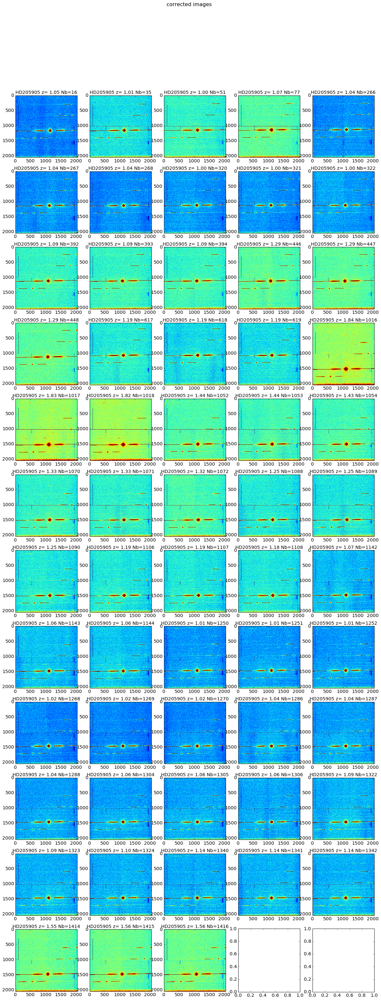

In [17]:
NBIMAGES=len(all_images)
f, axarr = plt.subplots(12,5,figsize=(20,50))
for index in np.arange(0,NBIMAGES):
    ix=index%5
    iy=index/5
    im=axarr[iy,ix].imshow(all_images[index],vmin=-10,vmax=100)
    axarr[iy,ix].set_title(all_titles[index])
title='corrected images'
plt.suptitle(title,size=16)        

## Show histograms
---------------------------

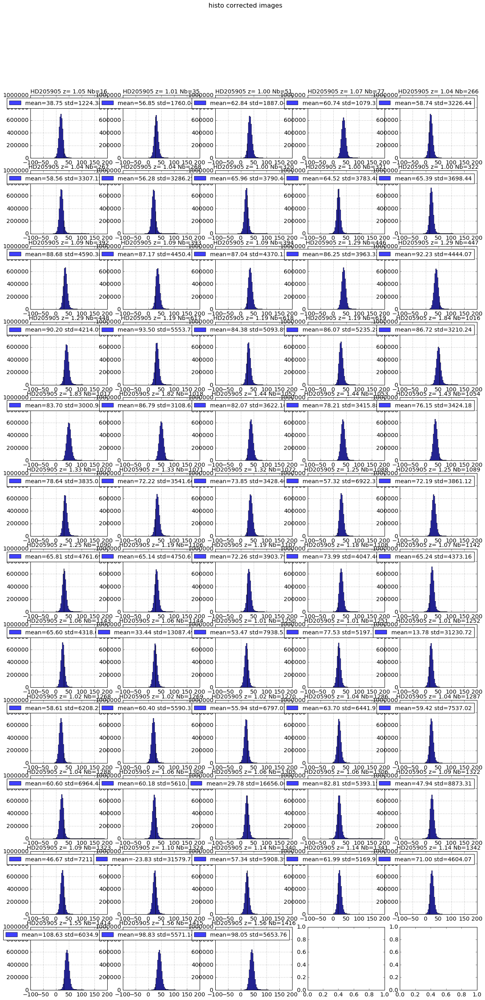

In [18]:
NBIMAGES=len(all_images)
f, axarr = plt.subplots(12,5,figsize=(20,40))
for index in np.arange(0,NBIMAGES):
    ix=index%5
    iy=index/5
    image_flat=all_images[index].flatten()
    stat_mean=image_flat.mean()
    stat_rms=image_flat.std()
    legtitle='mean={:4.2f} std={:4.2f}'.format(stat_mean,stat_rms)
    axarr[iy,ix].hist(image_flat,bins=100,range=(-100,200),facecolor='blue', alpha=0.75,label=legtitle);
    #axarr[iy,ix].set_yscale('log')
    axarr[iy,ix].grid(True)
    axarr[iy,ix].set_ylim(0.,1000000.)
    axarr[iy,ix].set_title(all_titles[index])
    axarr[iy,ix].legend(loc='best')  #useless
title='histo corrected images '
plt.suptitle(title,size=16)        

## Transfer the image in CCDData
====================================

In [19]:
NBIMAGES=len(all_images)
all_ccd = []
for index in np.arange(0,NBIMAGES):
    ccd=ccdproc.CCDData(all_images[index],unit='adu')
    all_ccd.append(ccd)

## Extraction of Background
===============================

In [20]:
sigma_clip = SigmaClip(sigma=3., iters=10)

In [21]:
bkg_estimator = MedianBackground()

In [22]:
NBIMAGES=len(all_ccd)
all_bkg = []
for index in np.arange(0,NBIMAGES):
    print 'compute background for image nb. ',index,' ',all_titles[index]
    bkg = Background2D(all_ccd[index], (100, 100), filter_size=(3, 3),method='median')
    #bkg = Background2D(ccd.data, (50, 50), filter_size=(3, 3),sigma_clip=sigma_clip,bkg_estimator=bkg_estimator)
    all_bkg.append(bkg)

compute background for image nb.  0   HD205905 z= 1.05 Nb=16
compute background for image nb.  1   HD205905 z= 1.01 Nb=35
compute background for image nb.  2   HD205905 z= 1.00 Nb=51
compute background for image nb.  3   HD205905 z= 1.07 Nb=77
compute background for image nb.  4   HD205905 z= 1.04 Nb=266
compute background for image nb.  5   HD205905 z= 1.04 Nb=267
compute background for image nb.  6   HD205905 z= 1.04 Nb=268
compute background for image nb.  7   HD205905 z= 1.00 Nb=320
compute background for image nb.  8   HD205905 z= 1.00 Nb=321
compute background for image nb.  9   HD205905 z= 1.00 Nb=322
compute background for image nb.  10   HD205905 z= 1.09 Nb=392
compute background for image nb.  11   HD205905 z= 1.09 Nb=393
compute background for image nb.  12   HD205905 z= 1.09 Nb=394
compute background for image nb.  13   HD205905 z= 1.29 Nb=446
compute background for image nb.  14   HD205905 z= 1.29 Nb=447
compute background for image nb.  15   HD205905 z= 1.29 Nb=448
comput

## Plot Background
=========================

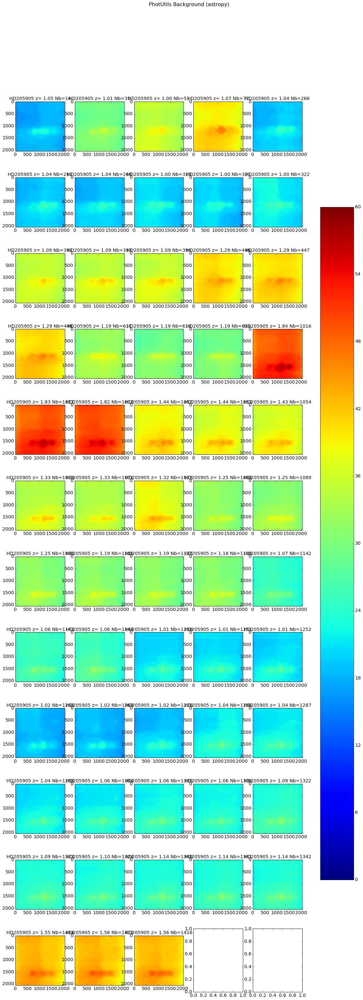

In [23]:
NBBKG=len(all_bkg)
f, axarr = plt.subplots(12,5,figsize=(20,50))
for index in np.arange(0,NBBKG):
    ix=index%5
    iy=index/5
    im=axarr[iy,ix].imshow(all_bkg[index].background,vmin=0,vmax=60)
    axarr[iy,ix].set_title(all_titles[index])
title='PhotUtils Background (astropy)'

f.colorbar(im, ax=axarr.ravel().tolist(),shrink=0.75)

plt.suptitle(title,size=16)    

## Do the background subtraction again
======================================================

In [24]:
NBIMAGES=len(all_ccd)
all_ccd_bgsub = []
for index in np.arange(0,NBIMAGES):
    ccd_bgsub=all_ccd[index] - all_bkg[index].background    
    all_ccd_bgsub.append(ccd_bgsub)

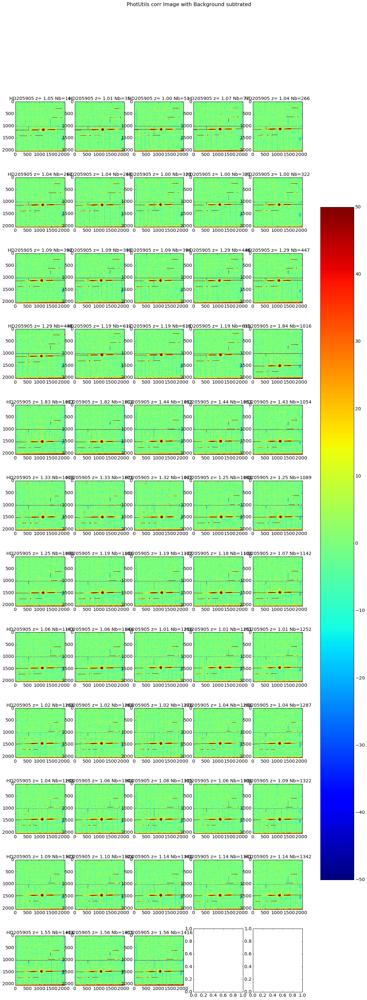

In [25]:
NBIMG=len(all_ccd_bgsub)
f, axarr = plt.subplots(12,5,figsize=(20,50))
for index in np.arange(0,NBIMG):
    ix=index%5
    iy=index/5
    im=axarr[iy,ix].imshow(all_ccd_bgsub[index],vmin=-50,vmax=50)
    axarr[iy,ix].set_title(all_titles[index])
title='PhotUtils corr Image with Background subtrated'
f.colorbar(im, ax=axarr.ravel().tolist(),shrink=0.75)
plt.suptitle(title,size=16) 

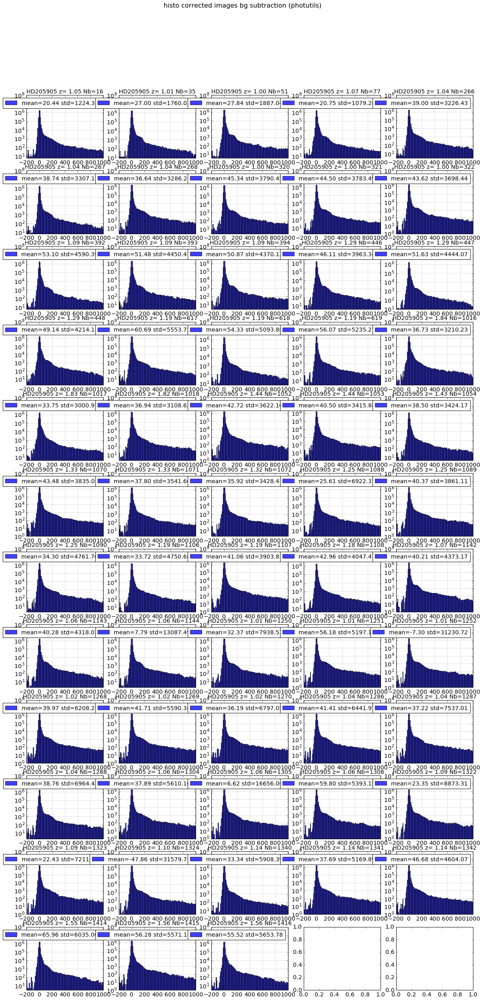

In [26]:
NBIMG=len(all_ccd_bgsub)
f, axarr = plt.subplots(12,5,figsize=(20,40))
for index in np.arange(0,NBIMG):
    ix=index%5
    iy=index/5
    image_flat=all_ccd_bgsub[index].flatten()
    stat_mean=image_flat.mean()
    stat_rms=image_flat.std()
    legtitle='mean={:4.2f} std={:4.2f}'.format(stat_mean,stat_rms)
    axarr[iy,ix].hist(image_flat,bins=120,range=(-200,1000),facecolor='blue', alpha=0.75,label=legtitle);
    axarr[iy,ix].set_yscale('log')
    axarr[iy,ix].grid(True)
    axarr[iy,ix].set_ylim(0.,100000000.)
    axarr[iy,ix].set_title(all_titles[index])
    axarr[iy,ix].legend(loc='best')  #useless
title='histo corrected images bg subtraction (photutils)'
plt.suptitle(title,size=16)        

## Save the files with background subtraction
----------------------------------------------------------

In [29]:
sorted_newfiles=[]
for file in sorted_files:
    trunk=re.findall('^corr_(.*fits$)',file)
    newfile='bkgsub_'+trunk[0]
    sorted_newfiles.append(newfile)

In [31]:
for idx,file in np.ndenumerate(sorted_newfiles):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=all_ccd_bgsub[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)